In [1]:
import arviz as az
import chi
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import plotly.colors
import pints
import scipy.stats
import seaborn as sns
sns.set_theme()

# 100 Individuals with 10 measurements each

In [91]:
np.random.seed(42)
n_ids = 100
times = np.arange(10)
n_times = len(times)
true_parameters = [
    1.3,   # Mean initial condition
    0.3,   # Std. initial condition
    0.7,   # Mean exponential growth
    0.2,   # Std. exponential growth
    200,   # Mean carrying capacity
    10,    # Std. carrying capacity
    0.1]   # Sigma
x0s = np.random.normal(
    loc=true_parameters[0], scale=true_parameters[1], size=n_ids)
lambdas = np.random.normal(
    loc=true_parameters[2], scale=true_parameters[3], size=n_ids)
capacities = np.random.normal(
    loc=true_parameters[4], scale=true_parameters[5], size=n_ids)
data = np.empty(shape=(n_ids, n_times))
for ids, x0 in enumerate(x0s):
    means = \
        capacities[ids] * x0 / (
        x0 + (capacities[ids] - x0) * np.exp(-lambdas[ids] * times))
    data[ids] = means + np.random.normal(
    loc=0, scale=true_parameters[6], size=n_times)

fig = go.Figure()
for _id, individual in enumerate(data):
    fig.add_trace(go.Scatter(
        x=times,
        y=individual,
        name='ID %d' % _id
    ))
fig.update_layout(
    xaxis_title='Time'
)
fig.show()

In [234]:
class ExactHierarchicalLogLikelihood(chi.LogLikelihood):
    def __init__(self, observations, times):
        self._observations = observations
        self._times = times
        self._n_ids, self._n_obs = observations.shape
        n_ids, n_obs = times.shape
        if (n_ids != self._n_ids) or (n_obs != self._n_obs):
            raise ValueError("Observations and times don't match.")

        self._error_model = chi.GaussianErrorModel()
        self._pop_model = chi.GaussianModel()

    def __call__(self, parameters):
        # Parse parameters
        eta_x0 = np.array(parameters[:self._n_ids])
        mu_x0, sigma_x0 = parameters[self._n_ids:self._n_ids+2]
        eta_lambda = np.array(parameters[self._n_ids+2:2*self._n_ids+2])
        mu_lambda, sigma_lambda = parameters[2*self._n_ids+2:2*self._n_ids+4]
        eta_capacity = np.array(parameters[2*self._n_ids+4:3*self._n_ids+4])
        mu_capacity, sigma_capacity, sigma = parameters[-3:]

        # NOTE: Etas score is added through priors.

        # Translate parameters
        x0s = mu_x0 + sigma_x0 * eta_x0
        lambdas = mu_lambda + sigma_lambda * eta_lambda
        capacities = mu_capacity + sigma_capacity * eta_capacity

        # Compute contributions from individual log-likelihoods
        means = \
            (capacities * x0s)[:, np.newaxis] / (
            x0s[:, np.newaxis] + (capacities - x0s)[:, np.newaxis] *
            np.exp(-lambdas[:, np.newaxis] * self._times))
        centred = self._observations - means
        score = np.sum(
            scipy.stats.norm(loc=0, scale=sigma).logpdf(centred))

        return score

    def evaluateS1(self, parameters):
        # Parse parameters
        eta_x0 = np.array(parameters[:self._n_ids])
        mu_x0, sigma_x0 = parameters[self._n_ids:self._n_ids+2]
        eta_lambda = np.array(parameters[self._n_ids+2:2*self._n_ids+2])
        mu_lambda, sigma_lambda = parameters[2*self._n_ids+2:2*self._n_ids+4]
        eta_capacity = np.array(parameters[2*self._n_ids+4:3*self._n_ids+4])
        mu_capacity, sigma_capacity, sigma = parameters[-3:]

        # NOTE: Etas score is added through priors.

        # Translate parameters
        x0s = mu_x0 + sigma_x0 * eta_x0
        lambdas = mu_lambda + sigma_lambda * eta_lambda
        capacities = mu_capacity + sigma_capacity * eta_capacity

        # Compute ode sensitivities
        means = \
            (capacities * x0s)[:, np.newaxis] / (
            x0s[:, np.newaxis] + (capacities - x0s)[:, np.newaxis] *
            np.exp(-lambdas[:, np.newaxis] * self._times))
        dode_dx0 = \
            capacities[:, np.newaxis] / (
                x0s[:, np.newaxis] + (capacities - x0s)[:, np.newaxis] *
                np.exp(-lambdas[:, np.newaxis] * self._times)) - \
            (capacities * x0s)[:, np.newaxis] / (
                x0s[:, np.newaxis] + (capacities - x0s)[:, np.newaxis] *
                np.exp(-lambdas[:, np.newaxis] * self._times)) ** 2 * (
                1 - np.exp(-lambdas[:, np.newaxis] * self._times))
        dode_dlambda = \
            (capacities - x0s)[:, np.newaxis] * means * self._times * \
                np.exp(-lambdas[:, np.newaxis] * self._times) / (
                x0s[:, np.newaxis] + (capacities - x0s)[:, np.newaxis] *
                np.exp(-lambdas[:, np.newaxis] * self._times))
        dode_dcapacity = \
            x0s[:, np.newaxis] / (
                x0s[:, np.newaxis] + (capacities - x0s)[:, np.newaxis] *
                np.exp(-lambdas[:, np.newaxis] * self._times)) - \
            (capacities * x0s)[:, np.newaxis] / (
                x0s[:, np.newaxis] + (capacities - x0s)[:, np.newaxis] *
                np.exp(-lambdas[:, np.newaxis] * self._times)) ** 2 * \
                np.exp(-lambdas[:, np.newaxis] * self._times)

        # Compute eta, mu and sigma sensitivities
        dode_deta_x0 = dode_dx0 * sigma_x0
        dode_dmu_x0 = dode_dx0
        dode_dsigma_x0 = dode_dx0 * eta_x0[:, np.newaxis]
        dode_deta_lambda = dode_dlambda * sigma_lambda
        dode_dmu_lambda = dode_dlambda
        dode_dsigma_lambda = dode_dlambda * eta_lambda[:, np.newaxis]
        dode_deta_capacity = dode_dcapacity * sigma_capacity
        dode_dmu_capacity = dode_dcapacity
        dode_dsigma_capacity = dode_dcapacity * eta_capacity[:, np.newaxis]

        score = 0
        sensitivities = np.zeros(self.n_parameters())
        for _id, indiv_obs in enumerate(self._observations):
            s, sens = self._error_model.compute_sensitivities(
                parameters=[sigma],
                model_output=means[_id],
                model_sensitivities=np.vstack([
                    dode_deta_x0[_id],
                    dode_dmu_x0[_id],
                    dode_dsigma_x0[_id],
                    dode_deta_lambda[_id],
                    dode_dmu_lambda[_id],
                    dode_dsigma_lambda[_id],
                    dode_deta_capacity[_id],
                    dode_dmu_capacity[_id],
                    dode_dsigma_capacity[_id]]).T,
                observations=indiv_obs)

            score += s
            sensitivities[_id] += sens[0]
            sensitivities[self._n_ids] += sens[1]
            sensitivities[self._n_ids+1] += sens[2]
            sensitivities[self._n_ids+2+_id] += sens[3]
            sensitivities[2*self._n_ids+2] += sens[4]
            sensitivities[2*self._n_ids+3] += sens[5]
            sensitivities[2*self._n_ids+4+_id] += sens[6]
            sensitivities[3*self._n_ids+4] += sens[7]
            sensitivities[3*self._n_ids+5] += sens[8]
            sensitivities[-1] += sens[-1]

        return score, sensitivities

    def n_parameters(self):
        return 3*self._n_ids + 7

    def get_parameter_names(self):
        return ['Eta x0'] * self._n_ids + ['Mean x0', 'Std. x0'] + [
            'Eta lambda'] * self._n_ids + ['Mean lambda', 'Std. lambda'] + [
            'Eta cap.'] * self._n_ids + ['Mean cap.', 'Std. cap.',
            'Pooled Sigma']

    def get_id(self):
        return ['ID %d' % _id for _id in range(self._n_ids)] + [None] * 2 + [
            'ID %d' % _id for _id in range(self._n_ids)] + [None] * 2 + [
            'ID %d' % _id for _id in range(self._n_ids)] + [None] * 3


class GaussianKDELogLikelihood(chi.LogLikelihood):
    def __init__(self, observations, times, n_ids=100, n_max_epsilons=None):
        # Observations are are expected to have shape
        # (n_obs_per_time, n_times).
        self._observations = np.array(observations)
        self._n_obs_per_time = len(self._observations)
        self._times = times
        self._n_times = len(times)
        self._n_ids = int(n_ids)
        self._normal = chi.GaussianErrorModel()
        self._n_epsilons = self._compute_n_epsilons(n_max_epsilons)
        self._epsilon_mask = self._compute_epsilon_mask()

        if times.ndim != 1:
            raise ValueError('Times needs to be a 1-dimensional array.')

    def __call__(self, parameters):
        # Parse parameters
        # NOTE: epsilon reshaping is done such that sensitivities can be
        # easily collected later
        eta_x0 = np.array(parameters[:self._n_ids])
        eta_lambda = np.array(parameters[self._n_ids:2*self._n_ids])
        eta_capacity = np.array(parameters[2*self._n_ids:3*self._n_ids])
        epsilon = np.array(
            parameters[3*self._n_ids:3*self._n_ids+self._n_epsilons])[
            self._epsilon_mask].reshape((self._n_times, self._n_ids)).T
        mu_x0, sigma_x0, mu_lambda, sigma_lambda, mu_capacity = \
            parameters[3*self._n_ids+self._n_epsilons:-2]
        sigma_capacity, sigma = parameters[-2:]

        # Compute measurements
        x0s = mu_x0 + sigma_x0 * eta_x0
        lambdas = mu_lambda + sigma_lambda * eta_lambda
        capacities = mu_capacity + sigma_capacity * eta_capacity
        measurements = \
            (capacities * x0s)[:, np.newaxis] / (
            x0s[:, np.newaxis] + (capacities - x0s)[:, np.newaxis] *
            np.exp(-lambdas[:, np.newaxis] * self._times[np.newaxis, :])
            ) + sigma * epsilon

        # Estimate population mean and population std from samples
        pop_mu = np.mean(measurements, axis=0)
        pop_sigma = np.std(measurements, ddof=1, axis=0)

        # Estimate likelihood with Gaussian KDE and compute associated
        # sensitivities
        score = 0
        for idt, obs_per_time in enumerate(self._observations.T):
            score += self._normal.compute_log_likelihood(
                parameters=[pop_sigma[idt]],
                model_output=np.array([pop_mu[idt]] * self._n_obs_per_time),
                observations=obs_per_time)

        if np.isnan(score):
            return -np.inf

        return score

    def _compute_epsilon_mask(self):
        """
        Computes epsilon mask that broadcasts n_epsilon to n_measurements.

        The broadcasting will be done in a naïve fashion, where the epsilons
        are appended until n_measurement noise parameters are available.
        """
        # We make sure that n_measurements is no multiple of n_epsilons before.
        n_full_copies = n_measurements // self._n_epsilons
        remainder = n_measurements % self._n_epsilons
        mask = np.hstack(
            [np.arange(self._n_epsilons)] * n_full_copies +
            [np.arange(remainder)])

        # Shift indices by number of parameters coming before the epsilons
        mask = mask + 3 * self._n_ids

        return mask

    def _compute_n_epsilons(self, n_max_epsilons):
        """
        Computes the number of noise parameters.

        If n_max_epsilons is smaller than the number of simulated measurements,
        noise variables are recycled.
        """
        n_measurements = self._n_ids * self._n_times
        if (not n_max_epsilons) or (n_measurements < n_max_epsilons):
            # Each simulated measurement has an independent noise variable.
            return self._n_ids * self._n_times

        if (n_max_epsilons < self._n_ids) or (
                n_max_epsilons % self._n_ids == 0):
            raise ValueError(
                'There have to be more noise parameters than simulated IDs '
                'n_max_epsilons cannot be a multiple of n_ids.')

        return n_max_epsilons

    def evaluateS1(self, parameters):
        # Parse parameters
        # NOTE: epsilon reshaping is done such that sensitivities can be
        # easily collected later
        eta_x0 = np.array(parameters[:self._n_ids])
        eta_lambda = np.array(parameters[self._n_ids:2*self._n_ids])
        eta_capacity = np.array(parameters[2*self._n_ids:3*self._n_ids])
        epsilon = np.array(parameters)[self._epsilon_mask].reshape(
            (self._n_times, self._n_ids)).T
        mu_x0, sigma_x0, mu_lambda, sigma_lambda, mu_capacity = \
            parameters[3*self._n_ids+self._n_epsilons:-2]
        sigma_capacity, sigma = parameters[-2:]

        # Compute measurements
        x0s = mu_x0 + sigma_x0 * eta_x0
        lambdas = mu_lambda + sigma_lambda * eta_lambda
        capacities = mu_capacity + sigma_capacity * eta_capacity
        measurements = \
            (capacities * x0s)[:, np.newaxis] / (
            x0s[:, np.newaxis] + (capacities - x0s)[:, np.newaxis] *
            np.exp(-lambdas[:, np.newaxis] * self._times[np.newaxis, :])
            ) + sigma * epsilon

        # Estimate population mean and population std from samples
        pop_mu = np.mean(measurements, axis=0)
        pop_sigma = np.std(measurements, ddof=1, axis=0)

        # Compute sensitivities of ODE w.r.t. individual parameters
        # (Can be replaced by myokit later)
        dode_dx0 = \
            capacities[:, np.newaxis] / (
                x0s[:, np.newaxis] + (capacities - x0s)[:, np.newaxis] *
                np.exp(-lambdas[:, np.newaxis] * self._times[np.newaxis, :])
                ) - \
            (capacities * x0s)[:, np.newaxis] / (
                x0s[:, np.newaxis] + (capacities - x0s)[:, np.newaxis] *
                np.exp(-lambdas[:, np.newaxis] * self._times[np.newaxis, :])
                ) ** 2 * (
                1 - np.exp(
                    -lambdas[:, np.newaxis] * self._times[np.newaxis, :]))
        dode_dlambda = \
            (capacities - x0s)[:, np.newaxis] * (
            capacities * x0s)[:, np.newaxis] / (
            x0s[:, np.newaxis] + (capacities - x0s)[:, np.newaxis] *
            np.exp(-lambdas[:, np.newaxis] * self._times[np.newaxis, :])
            ) * \
            self._times[np.newaxis, :] * \
            np.exp(-lambdas[:, np.newaxis] * self._times[np.newaxis, :]) / (
            x0s[:, np.newaxis] + (capacities - x0s)[:, np.newaxis] *
            np.exp(-lambdas[:, np.newaxis] * self._times[np.newaxis, :]))
        dode_dcapacity = \
            x0s[:, np.newaxis] / (
                x0s[:, np.newaxis] + (capacities - x0s)[:, np.newaxis] *
                np.exp(-lambdas[:, np.newaxis] * self._times[np.newaxis, :])
                ) - \
            (capacities * x0s)[:, np.newaxis] / (
                x0s[:, np.newaxis] + (capacities - x0s)[:, np.newaxis] *
                np.exp(-lambdas[:, np.newaxis] * self._times[np.newaxis, :])
                ) ** 2 * \
                np.exp(-lambdas[:, np.newaxis] * self._times[np.newaxis, :])

        # Compute sensitivities of pop_mu and pop_sigma to parameters
        dpop_mu_deta_x0 = dode_dx0 * sigma_x0 / self._n_ids
        dpop_mu_deta_lambda = dode_dlambda * sigma_lambda / self._n_ids
        dpop_mu_deta_capacity = dode_dcapacity * sigma_capacity / self._n_ids
        dpop_mu_depsilon = sigma / self._n_ids
        dpop_mu_dmu_x0 = np.sum(dode_dx0, axis=0) / self._n_ids
        dpop_mu_dsigma_x0 = \
            np.sum(dode_dx0 * eta_x0[:, np.newaxis], axis=0) / self._n_ids
        dpop_mu_dmu_lambda = np.sum(dode_dlambda, axis=0) / self._n_ids
        dpop_mu_dsigma_lambda = \
            np.sum(dode_dlambda * eta_lambda[:, np.newaxis], axis=0) \
            / self._n_ids
        dpop_mu_dmu_capacity = np.sum(dode_dcapacity, axis=0) / self._n_ids
        dpop_mu_dsigma_capacity = \
            np.sum(dode_dcapacity * eta_capacity[:, np.newaxis], axis=0) \
            / self._n_ids
        dpop_mu_dsigma = np.sum(epsilon, axis=0) / self._n_ids

        dpop_sigma_deta_x0 = \
            dode_dx0 * (measurements - pop_mu[np.newaxis, :]) * sigma_x0 / \
            (self._n_ids - 1) / pop_sigma[np.newaxis, :]
        dpop_sigma_deta_lambda = \
            dode_dlambda * (measurements - pop_mu[np.newaxis, :]) * \
            sigma_lambda / (self._n_ids - 1) / pop_sigma[np.newaxis, :]
        dpop_sigma_deta_capacity = \
            dode_dcapacity * (measurements - pop_mu[np.newaxis, :]) * \
            sigma_capacity / (self._n_ids - 1) / pop_sigma[np.newaxis, :]
        dpop_sigma_depsilon = \
            sigma * (measurements - pop_mu[np.newaxis, :]) \
            / (self._n_ids - 1) / pop_sigma[np.newaxis, :]
        dpop_sigma_dmu_x0 = \
            np.sum(
                (measurements - pop_mu[np.newaxis, :]) * dode_dx0, axis=0
            ) / pop_sigma / (self._n_ids - 1)
        dpop_sigma_dsigma_x0 = \
            np.sum(
                (measurements - pop_mu[np.newaxis, :]) * dode_dx0
                * eta_x0[:, np.newaxis], axis=0
            ) / pop_sigma / (self._n_ids - 1)
        dpop_sigma_dmu_lambda = \
            np.sum(
                (measurements - pop_mu[np.newaxis, :]) * dode_dlambda,
                axis=0) / pop_sigma / (self._n_ids - 1)
        dpop_sigma_dsigma_lambda = \
            np.sum(
                (measurements - pop_mu[np.newaxis, :]) * dode_dlambda
                * eta_lambda[:, np.newaxis], axis=0
            ) / pop_sigma / (self._n_ids - 1)
        dpop_sigma_dmu_capacity = \
            np.sum(
                (measurements - pop_mu[np.newaxis, :]) * dode_dcapacity,
                axis=0) / pop_sigma / (self._n_ids - 1)
        dpop_sigma_dsigma_capacity = \
            np.sum(
                (measurements - pop_mu[np.newaxis, :]) * dode_dcapacity
                * eta_capacity[:, np.newaxis], axis=0
            ) / pop_sigma / (self._n_ids - 1)
        dpop_sigma_dsigma = \
            np.sum(
                (measurements - pop_mu[np.newaxis, :]) * epsilon, axis=0) \
                / pop_sigma / (self._n_ids - 1)

        # Estimate likelihood with Gaussian KDE and compute associated
        # sensitivities
        score = 0
        sensitivities = np.zeros(self.n_parameters())
        for idt, obs_per_time in enumerate(self._observations.T):
            model_sensitivities = np.broadcast_to(np.hstack([
                dpop_mu_deta_x0[:, idt],        # One eta per ID
                dpop_mu_deta_lambda[:, idt],    # One eta per ID
                dpop_mu_deta_capacity[:, idt],  # One eta per ID
                dpop_mu_depsilon,               # Only one epsilon (all same)
                dpop_mu_dmu_x0[idt],
                dpop_mu_dsigma_x0[idt],
                dpop_mu_dmu_lambda[idt],
                dpop_mu_dsigma_lambda[idt],
                dpop_mu_dmu_capacity[idt],
                dpop_mu_dsigma_capacity[idt],
                dpop_mu_dsigma[idt]]),
                shape=(self._n_obs_per_time, 3*self._n_ids+8))
            s, sens = self._normal.compute_sensitivities(
                parameters=[pop_sigma[idt]],
                model_output=np.array([pop_mu[idt]] * self._n_obs_per_time),
                model_sensitivities=model_sensitivities,
                observations=obs_per_time)

            # Collect scores and sensitivities
            score += s
            sensitivities[:self._n_ids] += \
                sens[:self._n_ids] + sens[-1] * dpop_sigma_deta_x0[:, idt]
            sensitivities[self._n_ids:2*self._n_ids] += \
                sens[self._n_ids:2*self._n_ids] + \
                sens[-1] * dpop_sigma_deta_lambda[:, idt]
            sensitivities[2*self._n_ids:3*self._n_ids] += \
                sens[2*self._n_ids:3*self._n_ids] + \
                sens[-1] * dpop_sigma_deta_capacity[:, idt]
            sensitivities[
                self._epsilon_mask[idt*self._n_ids:(1+idt)*self._n_ids]] += \
                    sens[3*self._n_ids:3*self._n_ids+1] + \
                    sens[-1] * dpop_sigma_depsilon[:, idt]
            sensitivities[3*self._n_ids+self._n_epsilons] += \
                sens[3*self._n_ids+1] + sens[-1] * dpop_sigma_dmu_x0[idt]
            sensitivities[3*self._n_ids+self._n_epsilons+1] += \
                sens[3*self._n_ids+2] + sens[-1] * dpop_sigma_dsigma_x0[idt]
            sensitivities[3*self._n_ids+self._n_epsilons+2] += \
                sens[3*self._n_ids+3] + sens[-1] * dpop_sigma_dmu_lambda[idt]
            sensitivities[3*self._n_ids+self._n_epsilons+3] += \
                sens[3*self._n_ids+4] \
                + sens[-1] * dpop_sigma_dsigma_lambda[idt]
            sensitivities[3*self._n_ids+self._n_epsilons+4] += \
                sens[3*self._n_ids+5] + sens[-1] * dpop_sigma_dmu_capacity[idt]
            sensitivities[3*self._n_ids+self._n_epsilons+5] += \
                sens[3*self._n_ids+6] \
                + sens[-1] * dpop_sigma_dsigma_capacity[idt]
            sensitivities[3*self._n_ids+self._n_epsilons+6] += \
                sens[3*self._n_ids+7] + sens[-1] * dpop_sigma_dsigma[idt]

        return score, sensitivities

    def n_parameters(self):
        return 3*self._n_ids + self._n_epsilons + 7

    def get_parameter_names(self):
        # Construct epsilon sample names
        names = []
        for cycle in range(self._n_epsilons // self._n_ids):
            names += ['Epsilon cycle %d' % (cycle+1)] * self._n_ids

        # Add remainder (without ID for arviz visualisation purposes)
        for rest in range(self._n_epsilons % self._n_ids):
            names += ['Epsilon rest %d' % (rest + 1)]

        return [
            'Eta x0' for _ in range(self._n_ids)] + [
            'Eta lambda' for _ in range(self._n_ids)] + [
            'Eta capacity' for _ in range(self._n_ids)] + names + [
            'Mean x0', 'Std. x0', 'Mean lambda', 'Std. lambda',
            'Mean capacity', 'Std. capacity', 'Pooled Sigma']

    def get_id(self):
        full_cycles = self._n_epsilons // self._n_ids
        remainder = self._n_epsilons % self._n_ids
        return [
            'ID %d' % _id for _id in range(self._n_ids)
            ] * (3 + full_cycles) + [None] * (remainder + 7)

## Run inference with exact hierarchical likelihood

In [130]:
# Generate data
np.random.seed(42)
n_ids = 100
times = np.arange(10)
n_times = len(times)
true_parameters = [
    1.3,   # Mean initial condition
    0.3,   # Std. initial condition
    0.7,   # Mean exponential growth
    0.2,   # Std. exponential growth
    200,   # Mean carrying capacity
    10,    # Std. carrying capacity
    0.1]   # Sigma
eta_x0 = np.random.normal(loc=0, scale=1, size=n_ids)
x0s = true_parameters[0] + true_parameters[1] * eta_x0
eta_lambda = np.random.normal(loc=0, scale=1, size=n_ids)
lambdas = true_parameters[2] + true_parameters[3] * eta_lambda
eta_capacity = np.random.normal(loc=0, scale=1, size=n_ids)
capacities = true_parameters[4] + true_parameters[5] * eta_capacity
data = np.empty(shape=(n_ids, n_times))
for ids, x0 in enumerate(x0s):
    means = \
        capacities[ids] * x0 / (
        x0 + (capacities[ids] - x0) * np.exp(-lambdas[ids] * times))
    data[ids] = means + np.random.normal(
    loc=0, scale=true_parameters[6], size=n_times)
times = np.broadcast_to(np.arange(10), shape=(n_ids, n_times))

log_likelihood = ExactHierarchicalLogLikelihood(observations=data, times=times)
log_prior = pints.ComposedLogPrior(*[
    pints.GaussianLogPrior(0, 1)] * n_ids + [
    pints.GaussianLogPrior(
        true_parameters[0],
        10 * true_parameters[1]),
    pints.HalfCauchyLogPrior(
        true_parameters[1],
        2)] + [
    pints.GaussianLogPrior(0, 1)] * n_ids + [
    pints.GaussianLogPrior(
        true_parameters[2],
        10 * true_parameters[3]),
    pints.HalfCauchyLogPrior(
        true_parameters[3],
        2)] + [
    pints.GaussianLogPrior(0, 1)] * n_ids + [
    pints.GaussianLogPrior(
        true_parameters[4],
        10 * true_parameters[5]),
    pints.HalfCauchyLogPrior(
        true_parameters[5],
        10),
    pints.GaussianLogPrior(true_parameters[6], 0.1 * true_parameters[6]),
])
log_posterior = chi.LogPosterior(log_likelihood, log_prior)

controller = chi.SamplingController(log_posterior)
controller.set_transform(pints.ComposedTransformation(
    pints.IdentityTransformation(n_ids),
    pints.LogTransformation(2),
    pints.IdentityTransformation(n_ids),
    pints.LogTransformation(2),
    pints.IdentityTransformation(n_ids),
    pints.LogTransformation(3)))
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller._initial_params[0, 0] = np.hstack([
    eta_x0.flatten(), true_parameters[:2],
    eta_lambda.flatten(), true_parameters[2:4],
    eta_capacity.flatten(), true_parameters[4:]])
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 500
posterior_samples = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 0
thinning = 1
az.plot_trace(
    posterior_samples.sel(draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.


KeyboardInterrupt: 

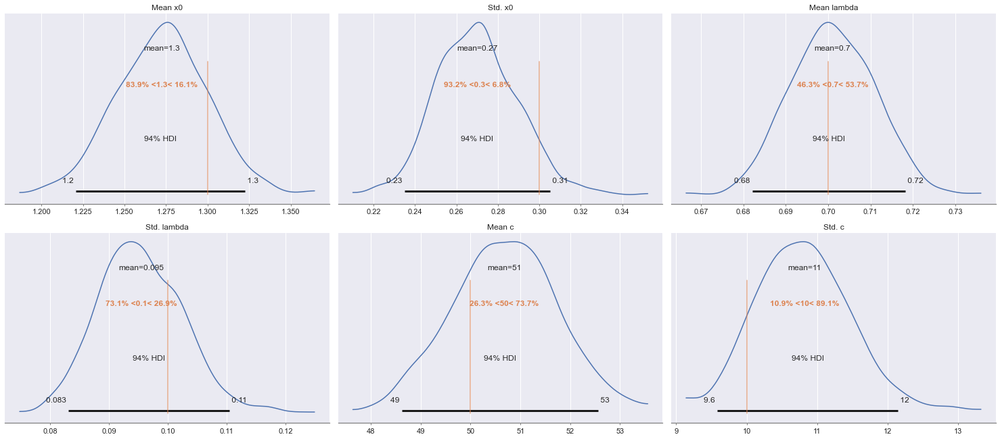

In [69]:
warmup = 500
thinning = 1
az.plot_posterior(
    posterior_samples.sel(draw=slice(warmup, n_iterations, thinning)),
    var_names=['Mean x0', 'Std. x0', 'Mean lambda', 'Std. lambda', 'Mean c', 'Std. c'],
    ref_val=true_parameters[:6])
plt.tight_layout()

## Run inference with KDE approximation

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     25     0.114    11       0:00.2
1     28     0.125    2        0:00.2
2     1051   0.43844  512      0:07.8
3     2074   0.444    512      0:15.5
20    15562  0.768    750      1:46.6
40    30447  0.742    709      3:28.5
60    43843  0.759    638      4:59.5
80    57848  0.76     667      6:35.4
100   71350  0.762    643      8:07.0
120   72229  0.711    42       8:14.0
140   72969  0.759    36       8:19.1
160   73699  0.736    35       8:25.0
180   74556  0.741    41       8:30.9
200   75297  0.764    36       8:36.8
220   76000  0.761    34       8:41.5
240   76679  0.74854  33       8:46.8
260   78229  0.735    74       8:57.1
280   78965  0.756754 36       9:02.9
300   80097  0.75     54       9:11.1
320   80730  0.752    31       9:15.3
340   81313  0.779    28       9:20.0
360   81973  0.748    32       9:24.4
380   82561  0.748    28       9:29.0
400   83163  0.74 

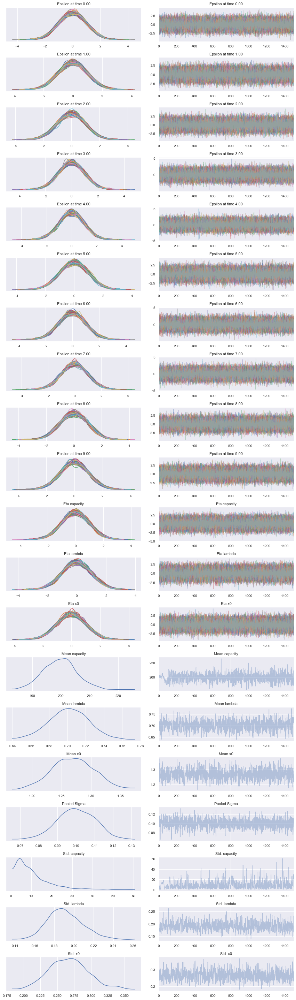

In [149]:
n_ids = 100
times = np.arange(10)
log_likelihood = GaussianKDELogLikelihood(
    observations=data, times=times, n_ids=n_ids)
n_measurements = n_ids * len(times)
log_prior = pints.ComposedLogPrior(*[
    pints.GaussianLogPrior(0, 1)] * 3 * n_ids + [
    pints.GaussianLogPrior(0, 1)] * n_measurements + [
    pints.GaussianLogPrior(
        true_parameters[0],
        1 * true_parameters[1]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[1]),
        1),
    pints.GaussianLogPrior(
        true_parameters[2],
        1 * true_parameters[3]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[3]),
        1),
    pints.GaussianLogPrior(
        true_parameters[4],
        1 * true_parameters[5]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[5]),
        1),
    pints.GaussianLogPrior(true_parameters[6], 0.1 * true_parameters[6]),
])
log_posterior = chi.LogPosterior(log_likelihood, log_prior)

controller = chi.SamplingController(log_posterior)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
controller._initial_params[0, 0, -7:] = true_parameters
n_iterations = 1500
posterior_samples = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup=0
az.plot_trace(
    posterior_samples.sel(draw=slice(warmup, n_iterations)))
plt.tight_layout()

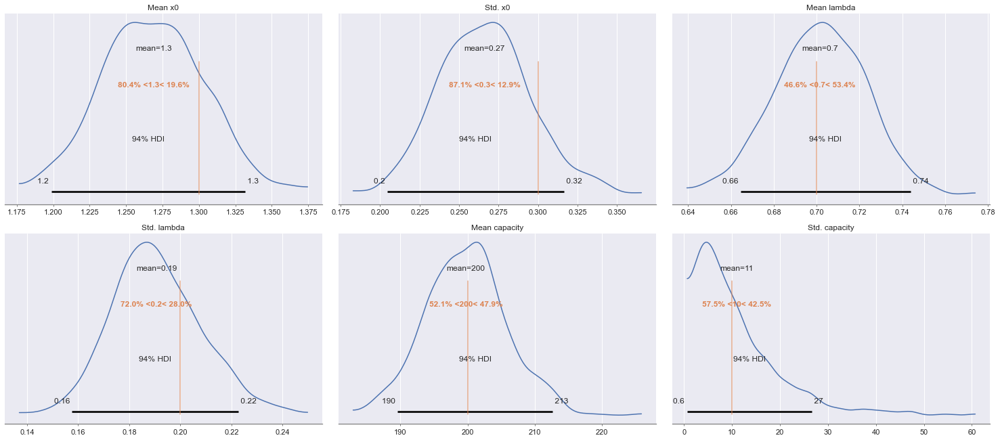

In [150]:
warmup = 500
thinning = 1
az.plot_posterior(
    posterior_samples.sel(draw=slice(warmup, n_iterations, thinning)),
    var_names=[
        'Mean x0', 'Std. x0', 'Mean lambda', 'Std. lambda', 'Mean capacity',
        'Std. capacity'],
    ref_val=true_parameters[:6])
plt.tight_layout()

# 150 individuals with 1 measurement each

In [207]:
# Generate data
np.random.seed(42)
n_ids = 150
times = np.arange(15)
n_times = len(times)
true_parameters = [
    1.3,   # Mean initial condition
    0.3,   # Std. initial condition
    0.7,   # Mean exponential growth
    0.2,   # Std. exponential growth
    200,   # Mean carrying capacity
    10,    # Std. carrying capacity
    0.1]   # Sigma
x0s = np.random.normal(
    loc=true_parameters[0], scale=true_parameters[1], size=n_ids)
lambdas = np.random.normal(
    loc=true_parameters[2], scale=true_parameters[3], size=n_ids)
capacities = np.random.normal(
    loc=true_parameters[4], scale=true_parameters[5], size=n_ids)
data = np.empty(shape=(n_ids, n_times))
for ids, x0 in enumerate(x0s):
    means = \
        capacities[ids] * x0 / (
        x0 + (capacities[ids] - x0) * np.exp(-lambdas[ids] * times))
    data[ids] = means + np.random.normal(
    loc=0, scale=true_parameters[6], size=n_times)

# Keep from each individual only one measurement
ids_per_time = n_ids // n_times
snapshot_data = np.zeros(shape=(n_times * ids_per_time, 1))
for idt, time in enumerate(times):
    snapshot_data[idt*ids_per_time:(idt+1)*ids_per_time, 0] = data[
        idt*ids_per_time:(idt+1)*ids_per_time, idt]
temp = []
for time in times:
    temp += [time] * ids_per_time
times = np.array([temp]).T

fig = go.Figure()
colors = plotly.colors.qualitative.Alphabet
n_colors = len(colors)
for _id, measurement in enumerate(snapshot_data[:, 0]):
    fig.add_trace(go.Scatter(
        x=[times[_id, 0]],
        y=[measurement],
        showlegend=False,
        marker=dict(color=colors[_id % n_colors])))
fig.update_layout(
    xaxis_title='Time',
)
fig.show()

## Run inference with exact likelihood

In [181]:
n_ids = 150
log_likelihood = ExactHierarchicalLogLikelihood(
    observations=snapshot_data, times=times)
log_prior = pints.ComposedLogPrior(*[
    pints.GaussianLogPrior(
        true_parameters[0], 100 * true_parameters[1])
    ] * n_ids + [
    pints.GaussianLogPrior(
        true_parameters[0],
        10 * true_parameters[1]),
    pints.CauchyLogPrior(
        true_parameters[1],
        2)] + [
     pints.GaussianLogPrior(
        true_parameters[2], 10 * true_parameters[3])
    ] * n_ids + [
    pints.GaussianLogPrior(
        true_parameters[2],
        10 * true_parameters[3]),
    pints.CauchyLogPrior(
        true_parameters[3],
        2)] + [
    pints.GaussianLogPrior(
        true_parameters[4], 10 * true_parameters[5])
    ] * n_ids + [
    pints.GaussianLogPrior(
        true_parameters[4],
        10 * true_parameters[5]),
    pints.CauchyLogPrior(
        true_parameters[5],
        2),
    pints.GaussianLogPrior(true_parameters[6], 0.1 * true_parameters[6]),
])
log_posterior = chi.LogPosterior(log_likelihood, log_prior)

controller = chi.SamplingController(log_posterior)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller._initial_params[0, 0] = np.hstack([
    x0s.flatten(), true_parameters[:2],
    lambdas.flatten(), true_parameters[2:4],
    capacities.flatten(), true_parameters[4:]])
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples.sel(draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

ValueError: not enough values to unpack (expected 2, got 1)

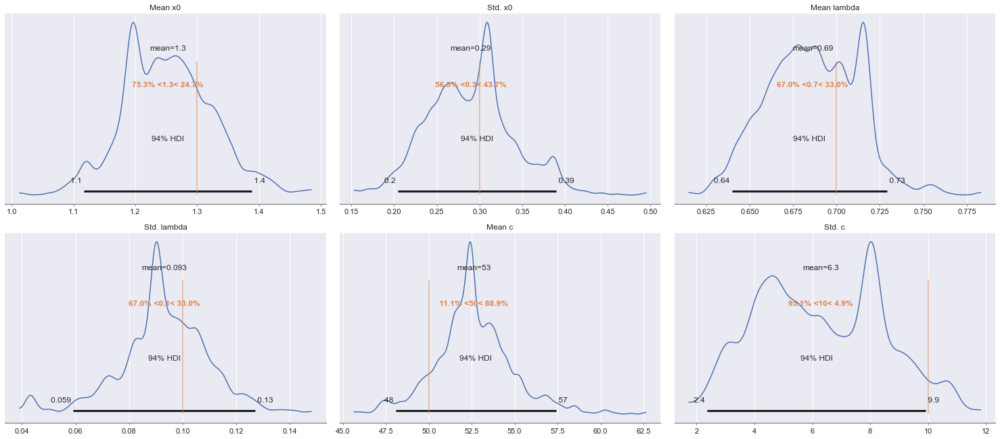

In [74]:
warmup = 500
thinning = 1
az.plot_posterior(
    posterior_samples.sel(draw=slice(warmup, n_iterations, thinning)),
    var_names=['Mean x0', 'Std. x0', 'Mean lambda', 'Std. lambda', 'Mean c', 'Std. c'],
    ref_val=true_parameters[:6])
plt.tight_layout()

## Run inference with Gaussian KDE likelihood

With 10 IDs

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     20     0.0322   8        0:00.1
1     21     0.25     1        0:00.1
2     28     0.5      4        0:00.1
3     35     0.5      4        0:00.1


/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:275: RuntimeWarning:

overflow encountered in square

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:296: RuntimeWarning:

overflow encountered in square



20    11485  0.752295 637      0:27.3
40    22048  0.786    503      0:51.2
60    30471  0.761    402      1:11.4
80    38281  0.744    372      1:29.3
100   45930  0.779    365      1:47.2
120   47449  0.719    73       1:50.7
140   50458  0.706    144      1:58.2
160   54329  0.734    185      2:06.8
180   56946  0.758    125      2:13.4
200   58625  0.764    80       2:17.2
220   60591  0.74     94       2:22.7
240   66279  0.762359 271      2:35.1
260   67660  0.705    66       2:39.1
280   72809  0.738    246      2:50.5
300   74171  0.745    65       2:54.5
320   75518  0.773    65       2:57.4
340   76973  0.76     70       3:01.6
360   77985  0.759    49       3:03.8
380   79879  0.757    91       3:08.9
400   80619  0.761    36       3:10.6
420   81856  0.744466 59       3:14.2
440   83297  0.755    69       3:17.4
460   84531  0.724    59       3:21.0
480   85798  0.724    61       3:23.8
500   88242  0.761    117      3:30.1
520   89722  0.828    71       3:33.4
540   91572 

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:258: RuntimeWarning:

overflow encountered in multiply

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:270: RuntimeWarning:

overflow encountered in multiply

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:275: RuntimeWarning:

overflow encountered in multiply

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:285: RuntimeWarning:

overflow encountered in multiply

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:287: RuntimeWarning:

overflow encountered in multiply

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:291: RuntimeWarning:

overflow encountered in multiply

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py

1160  147658  0.809    89       5:58.7
1180  149442  0.876    85       6:03.1
1200  151319  0.886    90       6:08.0
1220  153178  0.809    89       6:12.4
1240  154905  0.701    83       6:18.1
1260  156663  0.837    84       6:22.7
1280  158531  0.83     89       6:27.7
1300  160439  0.847    91       6:31.9
1320  162192  0.886    84       6:37.0
1340  163900  0.844    82       6:40.8
1360  165439  0.851    74       6:45.0
1380  167177  0.916    83       6:48.8
1400  169076  0.822    91       6:53.7
1420  170716  0.841    79       6:57.3
1440  172659  0.885    93       7:02.4
1460  174588  0.812    92       7:06.6
1480  176259  0.88165  80       7:11.2
1500  178148  0.85     95       7:15.4
Halting: Maximum number of iterations (1500) reached.


/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/arviz/plots/traceplot.py:210: UserWarning:

rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (25), generating only 20 plots



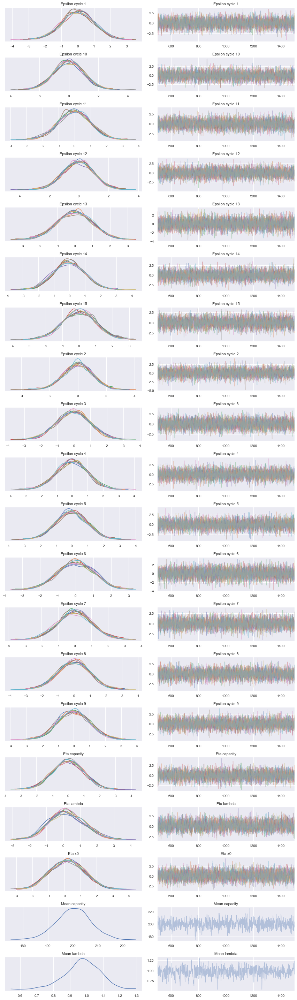

In [230]:
n_ids = 10
times = np.arange(15)
n_times = len(times)
n_ids_data = 150
ids_per_time = n_ids_data // n_times
log_likelihood = GaussianKDELogLikelihood(
    observations=snapshot_data.reshape((ids_per_time, n_times)).T,
    times=times, n_ids=n_ids, n_max_epsilons=1001)
n_measurements = n_ids * n_times
log_prior = pints.ComposedLogPrior(*[
    pints.GaussianLogPrior(0, 1)] * 3 * n_ids + [
    pints.GaussianLogPrior(0, 1)] * n_measurements + [
    pints.GaussianLogPrior(
        true_parameters[0],
        1 * true_parameters[1]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[1]),
        1),
    pints.GaussianLogPrior(
        true_parameters[2],
        1 * true_parameters[3]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[3]),
        1),
    pints.GaussianLogPrior(
        true_parameters[4],
        1 * true_parameters[5]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[5]),
        1),
    pints.GaussianLogPrior(true_parameters[6], 0.1 * true_parameters[6]),
])
log_posterior = chi.LogPosterior(log_likelihood, log_prior)

controller = chi.SamplingController(log_posterior)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
controller._initial_params[0, 0, -7:] = true_parameters
n_iterations = 1500
posterior_samples = controller.run(n_iterations=n_iterations, log_to_screen=True)

warmup=500
az.plot_trace(
    posterior_samples.sel(draw=slice(warmup, n_iterations)))
plt.tight_layout()

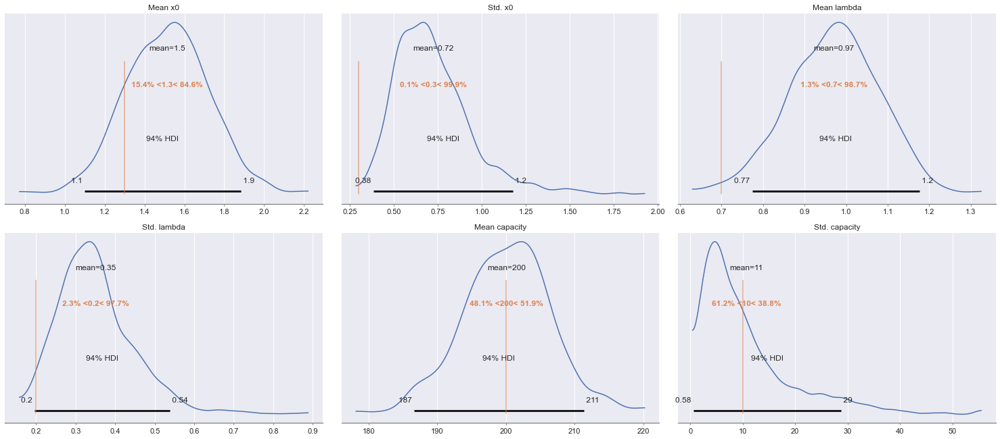

In [184]:
warmup = 500
thinning = 1
az.plot_posterior(
    posterior_samples.sel(draw=slice(warmup, n_iterations, thinning)),
    var_names=[
        'Mean x0', 'Std. x0', 'Mean lambda', 'Std. lambda', 'Mean capacity',
        'Std. capacity'],
    ref_val=true_parameters[:6])
plt.tight_layout()

with 100 IDs

In [235]:
n_ids = 100
n_max_epsilons = 501
times = np.arange(15)
n_times = len(times)
n_ids_data = 150
ids_per_time = n_ids_data // n_times
log_likelihood = GaussianKDELogLikelihood(
    observations=snapshot_data.reshape((ids_per_time, n_times)).T,
    times=times, n_ids=n_ids, n_max_epsilons=n_max_epsilons)
n_measurements = n_max_epsilons if n_max_epsilons else n_ids * n_times
log_prior = pints.ComposedLogPrior(*[
    pints.GaussianLogPrior(0, 1)] * 3 * n_ids + [
    pints.GaussianLogPrior(0, 1)] * n_measurements + [
    pints.GaussianLogPrior(
        true_parameters[0],
        1 * true_parameters[1]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[1]),
        1),
    pints.GaussianLogPrior(
        true_parameters[2],
        1 * true_parameters[3]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[3]),
        1),
    pints.GaussianLogPrior(
        true_parameters[4],
        1 * true_parameters[5]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[5]),
        1),
    pints.GaussianLogPrior(true_parameters[6], 0.1 * true_parameters[6]),
])
log_posterior = chi.LogPosterior(log_likelihood, log_prior)

controller = chi.SamplingController(log_posterior)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples = controller.run(n_iterations=n_iterations, log_to_screen=True)

warmup=500
az.plot_trace(
    posterior_samples.sel(draw=slice(warmup, n_iterations)))
plt.tight_layout()

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.


ValueError: cannot reshape array of size 501 into shape (15,100)

In [237]:
log_likelihood._epsilon_mask.shape

(501,)

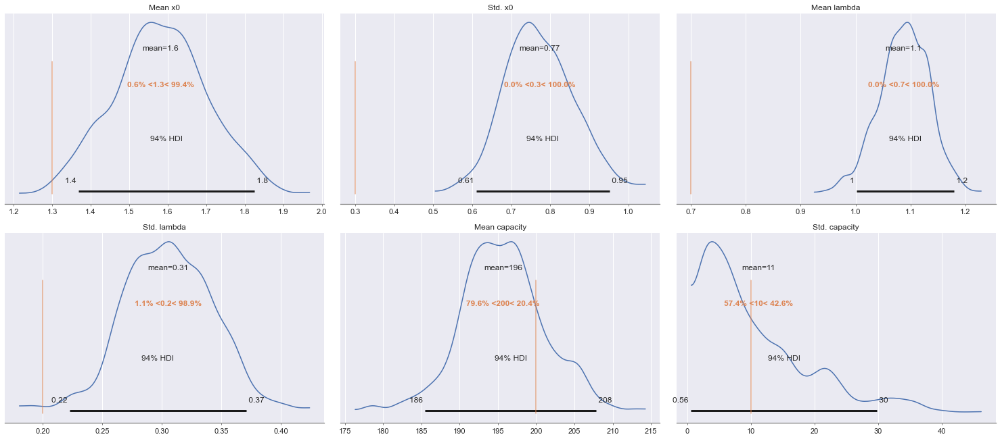

In [187]:
warmup = 500
thinning = 1
az.plot_posterior(
    posterior_samples.sel(draw=slice(warmup, n_iterations, thinning)),
    var_names=[
        'Mean x0', 'Std. x0', 'Mean lambda', 'Std. lambda', 'Mean capacity',
        'Std. capacity'],
    ref_val=true_parameters[:6])
plt.tight_layout()

with 1000 IDs

In [188]:
n_ids = 1000
times = np.arange(15)
n_times = len(times)
n_ids_data = 150
ids_per_time = n_ids_data // n_times
log_likelihood = GaussianKDELogLikelihood(
    observations=snapshot_data.reshape((ids_per_time, n_times)).T,
    times=times, n_ids=n_ids)
n_measurements = n_ids * n_times
log_prior = pints.ComposedLogPrior(*[
    pints.GaussianLogPrior(0, 1)] * 3 * n_ids + [
    pints.GaussianLogPrior(0, 1)] * n_measurements + [
    pints.GaussianLogPrior(
        true_parameters[0],
        1 * true_parameters[1]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[1]),
        1),
    pints.GaussianLogPrior(
        true_parameters[2],
        1 * true_parameters[3]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[3]),
        1),
    pints.GaussianLogPrior(
        true_parameters[4],
        1 * true_parameters[5]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[5]),
        1),
    pints.GaussianLogPrior(true_parameters[6], 0.1 * true_parameters[6]),
])
log_posterior = chi.LogPosterior(log_likelihood, log_prior)

controller = chi.SamplingController(log_posterior)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples = controller.run(n_iterations=n_iterations, log_to_screen=True)

warmup=500
az.plot_trace(
    posterior_samples.sel(draw=slice(warmup, n_iterations)))
plt.tight_layout()

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.


/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:219: RuntimeWarning:

overflow encountered in exp

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:231: RuntimeWarning:

overflow encountered in exp

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:236: RuntimeWarning:

overflow encountered in exp

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:236: RuntimeWarning:

overflow encountered in square

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:238: RuntimeWarning:

overflow encountered in exp

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:238: RuntimeWarning:

invalid value encountered in multiply

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:246: RuntimeWarn

Iter. Eval. Accept.   Steps. Time m:s
0     27     0.455    11       0:03.0
1     28     0.25     1        0:03.1
2     29     0.25     1        0:03.2
3     51     0.478    11       0:05.9
20    4638   0.741    255      6:10.3
40    6526   0.752    90       8:35.2
60    14780  0.719    394     19:10.0
80    25782  0.752    524     33:15.6
100   35088  0.799    444     44:59.8
120   38879  0.679    181     49:47.8
140   51163  0.709    585     65:21.2
160   60103  0.589    426     76:43.0
180   62382  0.79     109     79:35.6
200   69660  0.698    347     89:01.0
220   73446  0.729    181     94:06.9
240   83742  0.724    491    107:46.6
260   93311  0.618    456    120:33.2


KeyboardInterrupt: 

# 1000 individuals with 1 measurement each and longer time period

In [162]:
np.random.seed(42)
n_ids = 1000
times = np.arange(15)
n_times = len(times)
true_parameters = [
    1.3,   # Mean initial condition
    0.3,   # Std. initial condition
    0.7,   # Mean exponential growth
    0.2,   # Std. exponential growth
    200,   # Mean carrying capacity
    10,    # Std. carrying capacity
    0.1]   # Sigma
x0s = np.random.normal(
    loc=true_parameters[0], scale=true_parameters[1], size=n_ids)
lambdas = np.random.normal(
    loc=true_parameters[2], scale=true_parameters[3], size=n_ids)
capacities = np.random.normal(
    loc=true_parameters[4], scale=true_parameters[5], size=n_ids)
data = np.empty(shape=(n_ids, n_times))
for ids, x0 in enumerate(x0s):
    means = \
        capacities[ids] * x0 / (
        x0 + (capacities[ids] - x0) * np.exp(-lambdas[ids] * times))
    data[ids] = means + np.random.normal(
        loc=0, scale=true_parameters[6], size=n_times)

# Keep from each individual only one measurement
ids_per_time = n_ids // n_times
snapshot_data = np.zeros(shape=(n_times * ids_per_time, 1))
for idt, time in enumerate(times):
    snapshot_data[idt*ids_per_time:(idt+1)*ids_per_time, 0] = data[
        idt*ids_per_time:(idt+1)*ids_per_time, idt]
temp = []
for time in times:
    temp += [time] * ids_per_time
times = np.array([temp]).T

fig = go.Figure()
colors = plotly.colors.qualitative.Alphabet
n_colors = len(colors)
for _id, measurement in enumerate(snapshot_data[:, 0]):
    fig.add_trace(go.Scatter(
        x=[times[_id, 0]],
        y=[measurement],
        showlegend=False,
        marker=dict(color=colors[_id % n_colors])))
fig.update_layout(
    xaxis_title='Time',
    yaxis_type='log'
)
fig.show()

## Inference with Gaussian KDE log-likelihood

with 10 IDs

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     9      0.5      2        0:00.1
1     10     0.25     1        0:00.1
2     11     0.25     1        0:00.1
3     14     0.375    2        0:00.1


/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/pints/_mcmc/_nuts.py:260: RuntimeWarning:

overflow encountered in exp

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/pints/_mcmc/_nuts.py:159: RuntimeWarning:

overflow encountered in exp



20    14019  0.763    779      0:47.0
40    26939  0.730556 616      1:27.3
60    40795  0.765    660      2:12.1
80    56419  0.756    744      2:57.3
100   67663  0.736    536      3:29.8
120   71140  0.73     166      3:40.9
140   74094  0.775    141      3:49.5
160   76707  0.712    125      3:57.1
180   78894  0.757    105      4:04.5
200   81697  0.747    134      4:12.6
220   83225  0.777    73       4:17.1
240   86524  0.748    158      4:27.6
260   89462  0.712696 140      4:36.1
280   92778  0.739    158      4:45.7
300   95609  0.782    135      4:55.0
320   97889  0.755    109      5:01.5
340   100035  0.741    103      5:07.8
360   102672  0.744    126      5:16.2
380   105396  0.766    130      5:24.0
400   107656  0.755    108      5:30.5
420   111083  0.784    164      5:41.3
440   113174  0.732    100      5:47.3
460   115622  0.72     117      5:54.4
480   117898  0.78     109      6:01.8
500   120910  0.754    144      6:10.5
520   123450  0.89     121      6:18.1
54

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/arviz/plots/traceplot.py:210: UserWarning:

rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (25), generating only 20 plots



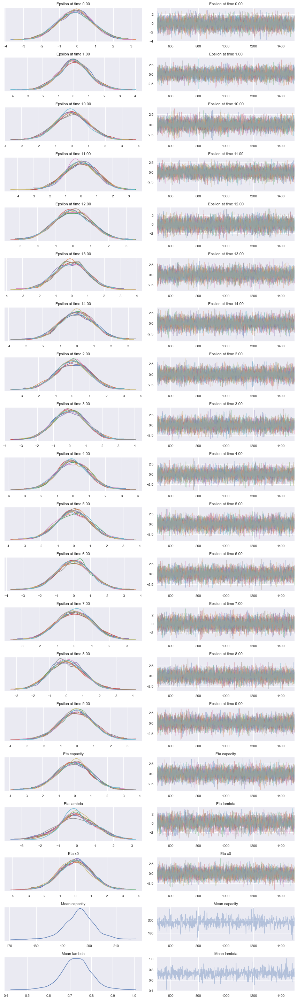

In [189]:
# Generate data
np.random.seed(42)
n_ids = 1000
times = np.arange(15)
n_times = len(times)
true_parameters = [
    1.3,   # Mean initial condition
    0.3,   # Std. initial condition
    0.7,   # Mean exponential growth
    0.2,   # Std. exponential growth
    200,   # Mean carrying capacity
    10,    # Std. carrying capacity
    0.1]   # Sigma
x0s = np.random.normal(
    loc=true_parameters[0], scale=true_parameters[1], size=n_ids)
lambdas = np.random.normal(
    loc=true_parameters[2], scale=true_parameters[3], size=n_ids)
capacities = np.random.normal(
    loc=true_parameters[4], scale=true_parameters[5], size=n_ids)
data = np.empty(shape=(n_ids, n_times))
for ids, x0 in enumerate(x0s):
    means = \
        capacities[ids] * x0 / (
        x0 + (capacities[ids] - x0) * np.exp(-lambdas[ids] * times))
    data[ids] = means + np.random.normal(
        loc=0, scale=true_parameters[6], size=n_times)

# Keep from each individual only one measurement
ids_per_time = n_ids // n_times
snapshot_data = np.zeros(shape=(ids_per_time, n_times))
for idt, time in enumerate(times):
    snapshot_data[:, idt] = data[idt*ids_per_time:(idt+1)*ids_per_time, idt]

# Infer parameters
n_ids = 10
log_likelihood = GaussianKDELogLikelihood(
    observations=snapshot_data, times=times, n_ids=n_ids)
n_measurements = n_ids * len(times)
log_prior = pints.ComposedLogPrior(*[
    pints.GaussianLogPrior(0, 1)] * 3 * n_ids + [
    pints.GaussianLogPrior(0, 1)] * n_measurements + [
    pints.GaussianLogPrior(
        true_parameters[0],
        1 * true_parameters[1]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[1]),
        1),
    pints.GaussianLogPrior(
        true_parameters[2],
        1 * true_parameters[3]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[3]),
        1),
    pints.GaussianLogPrior(
        true_parameters[4],
        1 * true_parameters[5]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[5]),
        1),
    pints.GaussianLogPrior(true_parameters[6], 0.1 * true_parameters[6]),
])
log_posterior = chi.LogPosterior(log_likelihood, log_prior)

controller = chi.SamplingController(log_posterior)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
# controller._initial_params[0, 0, -7:] = true_parameters
n_iterations = 1500
posterior_samples = controller.run(n_iterations=n_iterations, log_to_screen=True)

warmup=500
az.plot_trace(
    posterior_samples.sel(draw=slice(warmup, n_iterations)))
plt.tight_layout()

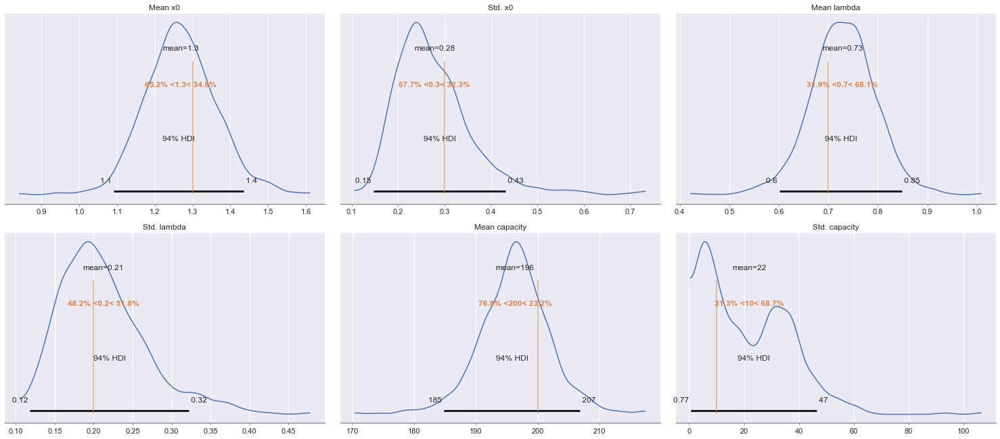

In [190]:
warmup = 500
thinning = 1
az.plot_posterior(
    posterior_samples.sel(draw=slice(warmup, n_iterations, thinning)),
    var_names=[
        'Mean x0', 'Std. x0', 'Mean lambda', 'Std. lambda', 'Mean capacity',
        'Std. capacity'],
    ref_val=true_parameters[:6])
plt.tight_layout()

with 100 IDs

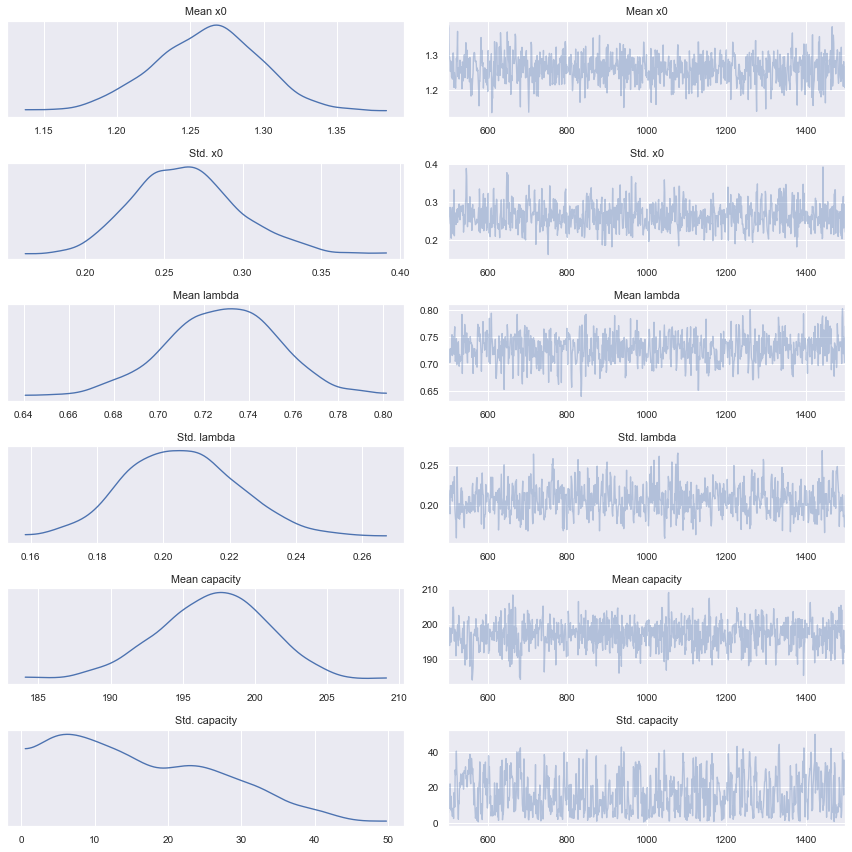

In [166]:
# Generate data
np.random.seed(42)
n_ids = 1000
times = np.arange(15)
n_times = len(times)
true_parameters = [
    1.3,   # Mean initial condition
    0.3,   # Std. initial condition
    0.7,   # Mean exponential growth
    0.2,   # Std. exponential growth
    200,   # Mean carrying capacity
    10,    # Std. carrying capacity
    0.1]   # Sigma
x0s = np.random.normal(
    loc=true_parameters[0], scale=true_parameters[1], size=n_ids)
lambdas = np.random.normal(
    loc=true_parameters[2], scale=true_parameters[3], size=n_ids)
capacities = np.random.normal(
    loc=true_parameters[4], scale=true_parameters[5], size=n_ids)
data = np.empty(shape=(n_ids, n_times))
for ids, x0 in enumerate(x0s):
    means = \
        capacities[ids] * x0 / (
        x0 + (capacities[ids] - x0) * np.exp(-lambdas[ids] * times))
    data[ids] = means + np.random.normal(
        loc=0, scale=true_parameters[6], size=n_times)

# Keep from each individual only one measurement
ids_per_time = n_ids // n_times
snapshot_data = np.zeros(shape=(ids_per_time, n_times))
for idt, time in enumerate(times):
    snapshot_data[:, idt] = data[idt*ids_per_time:(idt+1)*ids_per_time, idt]

# Infer parameters
n_ids = 100
log_likelihood = GaussianKDELogLikelihood(
    observations=snapshot_data, times=times, n_ids=n_ids)
n_measurements = n_ids * len(times)
log_prior = pints.ComposedLogPrior(*[
    pints.GaussianLogPrior(0, 1)] * 3 * n_ids + [
    pints.GaussianLogPrior(0, 1)] * n_measurements + [
    pints.GaussianLogPrior(
        true_parameters[0],
        1 * true_parameters[1]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[1]),
        1),
    pints.GaussianLogPrior(
        true_parameters[2],
        1 * true_parameters[3]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[3]),
        1),
    pints.GaussianLogPrior(
        true_parameters[4],
        1 * true_parameters[5]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[5]),
        1),
    pints.GaussianLogPrior(true_parameters[6], 0.1 * true_parameters[6]),
])
log_posterior = chi.LogPosterior(log_likelihood, log_prior)

controller = chi.SamplingController(log_posterior)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
# controller._initial_params[0, 0, -7:] = true_parameters
n_iterations = 1500
posterior_samples = controller.run(n_iterations=n_iterations, log_to_screen=True)

warmup=500
az.plot_trace(
    posterior_samples.sel(draw=slice(warmup, n_iterations)))
plt.tight_layout()

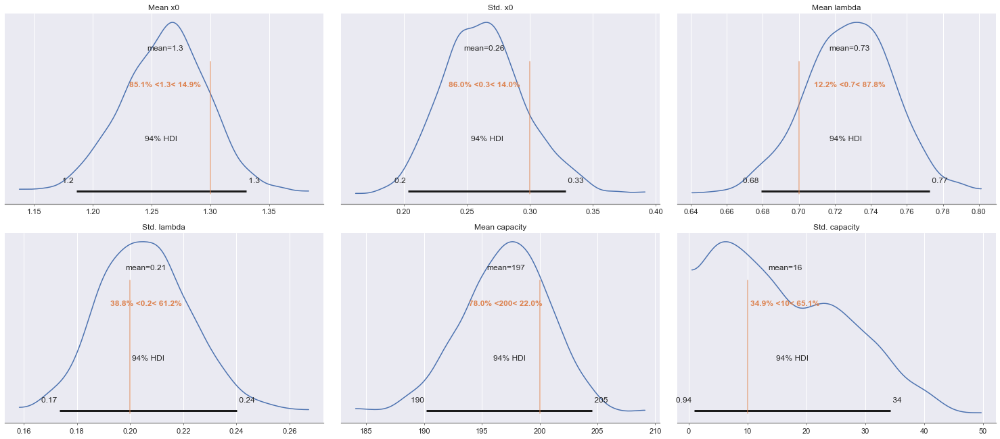

In [165]:
warmup = 500
thinning = 1
az.plot_posterior(
    posterior_samples.sel(draw=slice(warmup, n_iterations, thinning)),
    var_names=[
        'Mean x0', 'Std. x0', 'Mean lambda', 'Std. lambda', 'Mean capacity',
        'Std. capacity'],
    ref_val=true_parameters[:6])
plt.tight_layout()

200 IDs

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     62     0.343    27       0:01.1
1     63     0.25     1        0:01.1
2     64     0.25     1        0:01.1
3     71     0.193    4        0:01.3
20    9169   0.746    506      2:31.2
40    22480  0.766    634      6:11.6
60    35374  0.73     614      9:43.4
80    49239  0.766    661     13:33.9
100   61794  0.721    598     17:02.1
120   74325  0.722    597     20:29.7
140   85819  0.762    548     23:38.5
160   99451  0.723    649     27:25.5
180   104800  0.734    255     28:50.7
200   113627  0.764    421     31:18.5
220   123341  0.756    463     34:01.6
240   133873  0.772    502     36:56.5
260   145583  0.7      558     40:14.8
280   157708  0.74     578     43:37.6
300   172497  0.766    705     47:44.1
320   183522  0.755    525     50:48.4
340   195188  0.758    556     54:01.3
360   208298  0.74     625     57:38.8
380   222005  0.755    653     61:24.6
400   2

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/arviz/plots/traceplot.py:210: UserWarning:

rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (25), generating only 20 plots



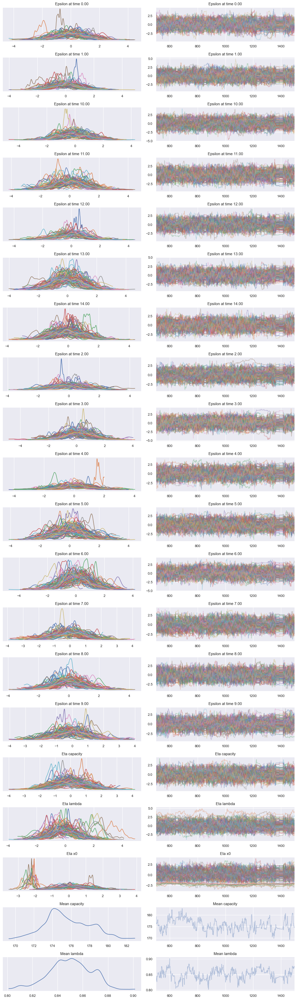

In [192]:
# Generate data
np.random.seed(42)
n_ids = 1000
times = np.arange(15)
n_times = len(times)
true_parameters = [
    1.3,   # Mean initial condition
    0.3,   # Std. initial condition
    0.7,   # Mean exponential growth
    0.2,   # Std. exponential growth
    200,   # Mean carrying capacity
    10,    # Std. carrying capacity
    0.1]   # Sigma
x0s = np.random.normal(
    loc=true_parameters[0], scale=true_parameters[1], size=n_ids)
lambdas = np.random.normal(
    loc=true_parameters[2], scale=true_parameters[3], size=n_ids)
capacities = np.random.normal(
    loc=true_parameters[4], scale=true_parameters[5], size=n_ids)
data = np.empty(shape=(n_ids, n_times))
for ids, x0 in enumerate(x0s):
    means = \
        capacities[ids] * x0 / (
        x0 + (capacities[ids] - x0) * np.exp(-lambdas[ids] * times))
    data[ids] = means + np.random.normal(
        loc=0, scale=true_parameters[6], size=n_times)

# Keep from each individual only one measurement
ids_per_time = n_ids // n_times
snapshot_data = np.zeros(shape=(ids_per_time, n_times))
for idt, time in enumerate(times):
    snapshot_data[:, idt] = data[idt*ids_per_time:(idt+1)*ids_per_time, idt]

# Infer parameters
n_ids = 150
log_likelihood = GaussianKDELogLikelihood(
    observations=snapshot_data, times=times, n_ids=n_ids)
n_measurements = n_ids * len(times)
log_prior = pints.ComposedLogPrior(*[
    pints.GaussianLogPrior(0, 1)] * 3 * n_ids + [
    pints.GaussianLogPrior(0, 1)] * n_measurements + [
    pints.GaussianLogPrior(
        true_parameters[0],
        1 * true_parameters[1]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[1]),
        1),
    pints.GaussianLogPrior(
        true_parameters[2],
        1 * true_parameters[3]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[3]),
        1),
    pints.GaussianLogPrior(
        true_parameters[4],
        1 * true_parameters[5]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[5]),
        1),
    pints.GaussianLogPrior(true_parameters[6], 0.1 * true_parameters[6]),
])
log_posterior = chi.LogPosterior(log_likelihood, log_prior)

controller = chi.SamplingController(log_posterior)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
# controller._initial_params[0, 0, -7:] = true_parameters
n_iterations = 1500
posterior_samples = controller.run(n_iterations=n_iterations, log_to_screen=True)

warmup=500
az.plot_trace(
    posterior_samples.sel(draw=slice(warmup, n_iterations)))
plt.tight_layout()

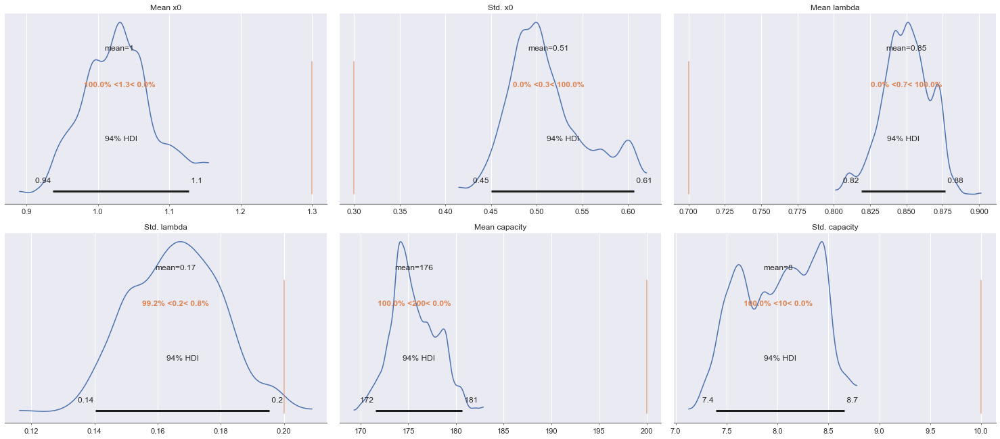

In [194]:
warmup = 500
thinning = 1
az.plot_posterior(
    posterior_samples.sel(draw=slice(warmup, n_iterations, thinning)),
    var_names=[
        'Mean x0', 'Std. x0', 'Mean lambda', 'Std. lambda', 'Mean capacity',
        'Std. capacity'],
    ref_val=true_parameters[:6])
plt.tight_layout()

### Longer time and more measurements to see whether bump goes away in Std. capacity

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     10     0.333    1        0:00.2


/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:219: RuntimeWarning:

overflow encountered in exp

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:219: RuntimeWarning:

overflow encountered in multiply

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:231: RuntimeWarning:

overflow encountered in exp

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:231: RuntimeWarning:

overflow encountered in multiply

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:236: RuntimeWarning:

overflow encountered in exp

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:236: RuntimeWarning:

overflow encountered in multiply

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/ipykernel_launcher.py:236: RuntimeWa

1     11     0.25     1        0:00.2
2     12     0.25     1        0:00.2
3     62     0.0098   25       0:01.1
20    13125  0.800443 726      3:39.5
40    28326  0.76     724      7:49.4
60    45127  0.773    801     12:26.0
80    61844  0.75     797     17:00.2
100   76779  0.736    711     21:07.0
120   85085  0.743    396     23:29.4
140   92110  0.741    335     25:25.7
160   96264  0.742    198     26:35.0
180   100853  0.752    219     27:51.3
200   105059  0.758    201     29:01.0
220   108375  0.756    158     29:55.6
240   111782  0.741    163     30:52.5
260   115232  0.73     164     31:49.3
280   119713  0.749    214     33:02.9
300   122939  0.781    154     33:55.8
320   126111  0.756    152     34:48.5
340   130077  0.766    189     35:53.4
360   132895  0.728    135     36:39.5
380   136082  0.782482 152     37:32.0
400   139228  0.768    150     38:24.7
420   141580  0.727556 112     39:03.4
440   145016  0.759    164     40:00.0
460   148908  0.721    186     41:03

/Users/david/Workspace/sabs-r3/warfarin/venv/lib/python3.7/site-packages/arviz/plots/traceplot.py:210: UserWarning:

rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (35), generating only 20 plots



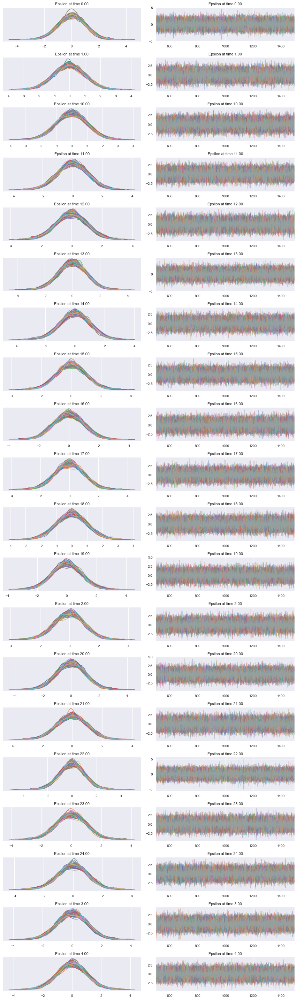

In [168]:
# Generate data
np.random.seed(42)
n_ids = 10000
times = np.arange(25)
n_times = len(times)
true_parameters = [
    1.3,   # Mean initial condition
    0.3,   # Std. initial condition
    0.7,   # Mean exponential growth
    0.2,   # Std. exponential growth
    200,   # Mean carrying capacity
    10,    # Std. carrying capacity
    0.1]   # Sigma
x0s = np.random.normal(
    loc=true_parameters[0], scale=true_parameters[1], size=n_ids)
lambdas = np.random.normal(
    loc=true_parameters[2], scale=true_parameters[3], size=n_ids)
capacities = np.random.normal(
    loc=true_parameters[4], scale=true_parameters[5], size=n_ids)
data = np.empty(shape=(n_ids, n_times))
for ids, x0 in enumerate(x0s):
    means = \
        capacities[ids] * x0 / (
        x0 + (capacities[ids] - x0) * np.exp(-lambdas[ids] * times))
    data[ids] = means + np.random.normal(
        loc=0, scale=true_parameters[6], size=n_times)

# Keep from each individual only one measurement
ids_per_time = n_ids // n_times
snapshot_data = np.zeros(shape=(ids_per_time, n_times))
for idt, time in enumerate(times):
    snapshot_data[:, idt] = data[idt*ids_per_time:(idt+1)*ids_per_time, idt]

# Infer parameters
n_ids = 100
log_likelihood = GaussianKDELogLikelihood(
    observations=snapshot_data, times=times, n_ids=n_ids)
n_measurements = n_ids * len(times)
log_prior = pints.ComposedLogPrior(*[
    pints.GaussianLogPrior(0, 1)] * 3 * n_ids + [
    pints.GaussianLogPrior(0, 1)] * n_measurements + [
    pints.GaussianLogPrior(
        true_parameters[0],
        1 * true_parameters[1]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[1]),
        1),
    pints.GaussianLogPrior(
        true_parameters[2],
        1 * true_parameters[3]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[3]),
        1),
    pints.GaussianLogPrior(
        true_parameters[4],
        1 * true_parameters[5]),
    pints.LogNormalLogPrior(
        np.log(true_parameters[5]),
        1),
    pints.GaussianLogPrior(true_parameters[6], 0.1 * true_parameters[6]),
])
log_posterior = chi.LogPosterior(log_likelihood, log_prior)

controller = chi.SamplingController(log_posterior)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
# controller._initial_params[0, 0, -7:] = true_parameters
n_iterations = 1500
posterior_samples = controller.run(n_iterations=n_iterations, log_to_screen=True)

warmup=500
az.plot_trace(
    posterior_samples.sel(draw=slice(warmup, n_iterations)))
plt.tight_layout()

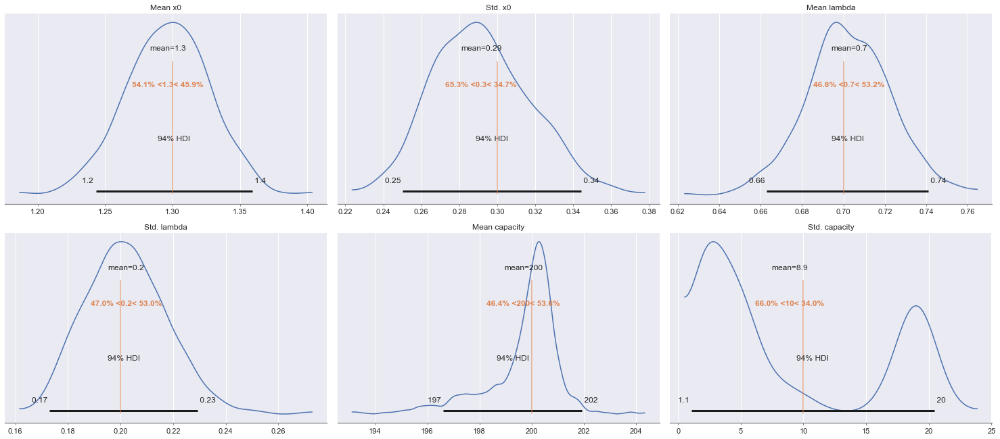

In [169]:
warmup = 500
thinning = 1
az.plot_posterior(
    posterior_samples.sel(draw=slice(warmup, n_iterations, thinning)),
    var_names=[
        'Mean x0', 'Std. x0', 'Mean lambda', 'Std. lambda', 'Mean capacity',
        'Std. capacity'],
    ref_val=true_parameters[:6])
plt.tight_layout()

## Look at time slice distribution of data-generating process 

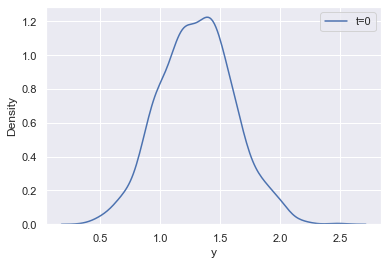

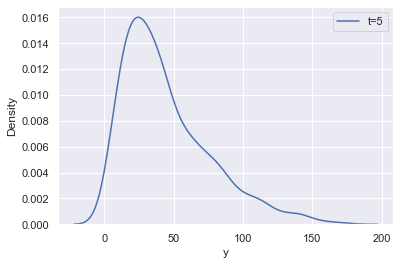

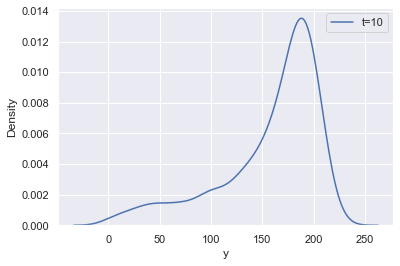

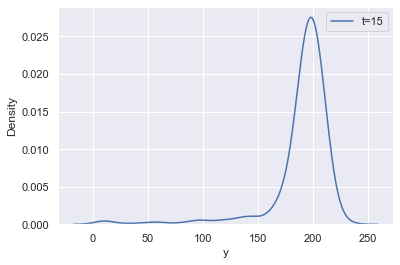

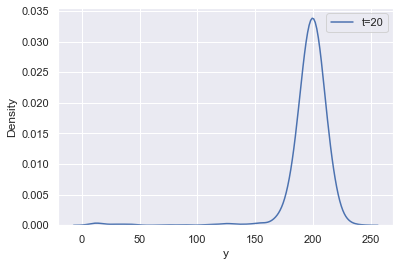

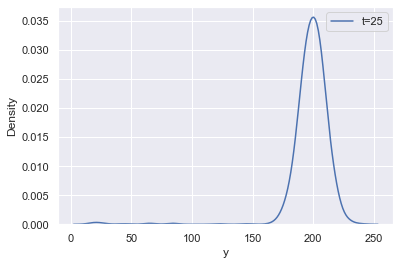

In [170]:
np.random.seed(42)
n_ids = 1000
times = np.array([0, 5, 10, 15, 20, 25])
n_times = len(times)
true_parameters = [
    1.3,   # Mean initial condition
    0.3,   # Std. initial condition
    0.7,   # Mean exponential growth
    0.2,   # Std. exponential growth
    200,   # Mean carrying capacity
    10,    # Std. carrying capacity
    0.1]   # Sigma
x0s = np.random.normal(
    loc=true_parameters[0], scale=true_parameters[1], size=n_ids)
lambdas = np.random.normal(
    loc=true_parameters[2], scale=true_parameters[3], size=n_ids)
capacities = np.random.normal(
    loc=true_parameters[4], scale=true_parameters[5], size=n_ids)
data = np.empty(shape=(n_ids, n_times))
for ids, x0 in enumerate(x0s):
    means = \
        capacities[ids] * x0 / (
        x0 + (capacities[ids] - x0) * np.exp(-lambdas[ids] * times))
    data[ids] = means + np.random.normal(
    loc=0, scale=true_parameters[6], size=n_times)

# Visualise data
ax = sns.kdeplot(x=data[:, 0], label='t=0')
ax.set_xlabel('y')
plt.legend()
plt.show()

ax = sns.kdeplot(x=data[:, 1], label='t=5')
ax.set_xlabel('y')
plt.legend()
plt.show()

ax = sns.kdeplot(x=data[:, 2], label='t=10')
ax.set_xlabel('y')
plt.legend()
plt.show()

ax = sns.kdeplot(x=data[:, 3], label='t=15')
ax.set_xlabel('y')
plt.legend()
plt.show()

ax = sns.kdeplot(x=data[:, 4], label='t=20')
ax.set_xlabel('y')
plt.legend()
plt.show()

ax = sns.kdeplot(x=data[:, 5], label='t=25')
ax.set_xlabel('y')
plt.legend()
plt.show()